In [1]:
import glob

import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from scipy.io import loadmat

import mne
from mne.preprocessing import ICA

In [2]:
matfiles = glob.glob('ADHD_part2/*.mat') 

matfiles

['ADHD_part2/v177.mat',
 'ADHD_part2/v215.mat',
 'ADHD_part2/v200.mat',
 'ADHD_part2/v213.mat',
 'ADHD_part2/v206.mat',
 'ADHD_part2/v204.mat',
 'ADHD_part2/v238.mat',
 'ADHD_part2/v198.mat',
 'ADHD_part2/v263.mat',
 'ADHD_part2/v288.mat',
 'ADHD_part2/v274.mat',
 'ADHD_part2/v270.mat',
 'ADHD_part2/v265.mat',
 'ADHD_part2/v254.mat',
 'ADHD_part2/v286.mat',
 'ADHD_part2/v279.mat',
 'ADHD_part2/v250.mat',
 'ADHD_part2/v244.mat',
 'ADHD_part2/v246.mat',
 'ADHD_part2/v284.mat',
 'ADHD_part2/v181.mat',
 'ADHD_part2/v234.mat',
 'ADHD_part2/v209.mat',
 'ADHD_part2/v196.mat',
 'ADHD_part2/v236.mat',
 'ADHD_part2/v183.mat',
 'ADHD_part2/v227.mat',
 'ADHD_part2/v179.mat',
 'ADHD_part2/v190.mat',
 'ADHD_part2/v231.mat',
 'ADHD_part2/v219.mat']

In [3]:
mat_data = loadmat(matfiles[10])
eeg_data = mat_data['v274']

In [4]:
ch_names = ['Fz', 'Cz', 'Pz', 'C3', 'T3', 'C4', 'T4', 'Fp1', 'Fp2', 'F3', 'F4', 'F7', 'F8', 'P3', 'P4', 'T5', 'T6', 'O1', 'O2']
sfreq = 128

info = mne.create_info(ch_names = ch_names, sfreq=sfreq, ch_types = 'eeg')

eeg_data = eeg_data.T

In [5]:
info

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,128.00 Hz
Highpass,0.00 Hz
Lowpass,64.00 Hz


In [6]:
raw = mne.io.RawArray(eeg_data, info)
raw.apply_function(lambda x: x*1e-6, channel_wise=False)

Creating RawArray with float64 data, n_channels=19, n_times=17323
    Range : 0 ... 17322 =      0.000 ...   135.328 secs
Ready.


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,128.00 Hz
Highpass,0.00 Hz
Lowpass,64.00 Hz


Using matplotlib as 2D backend.


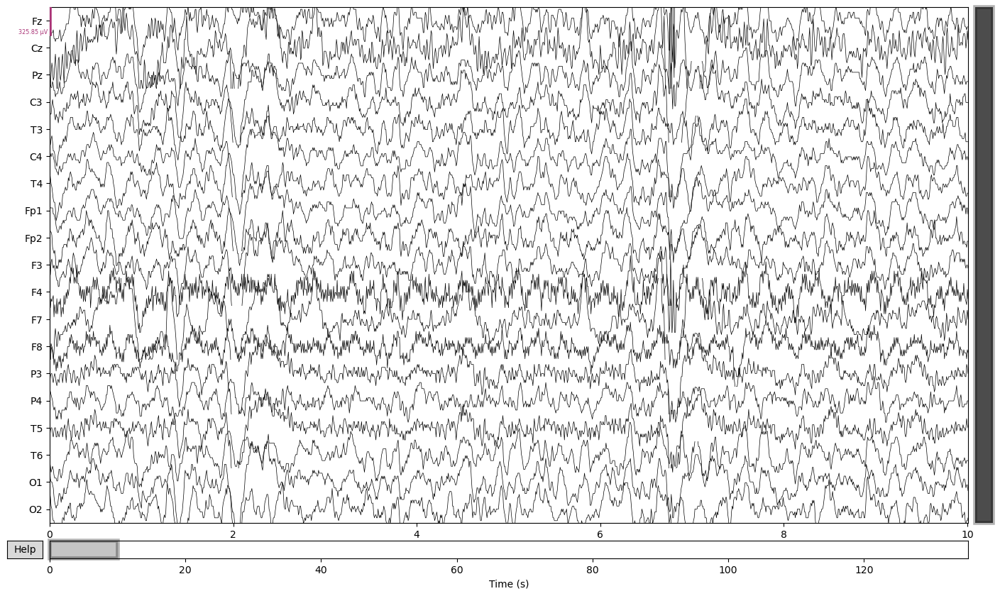

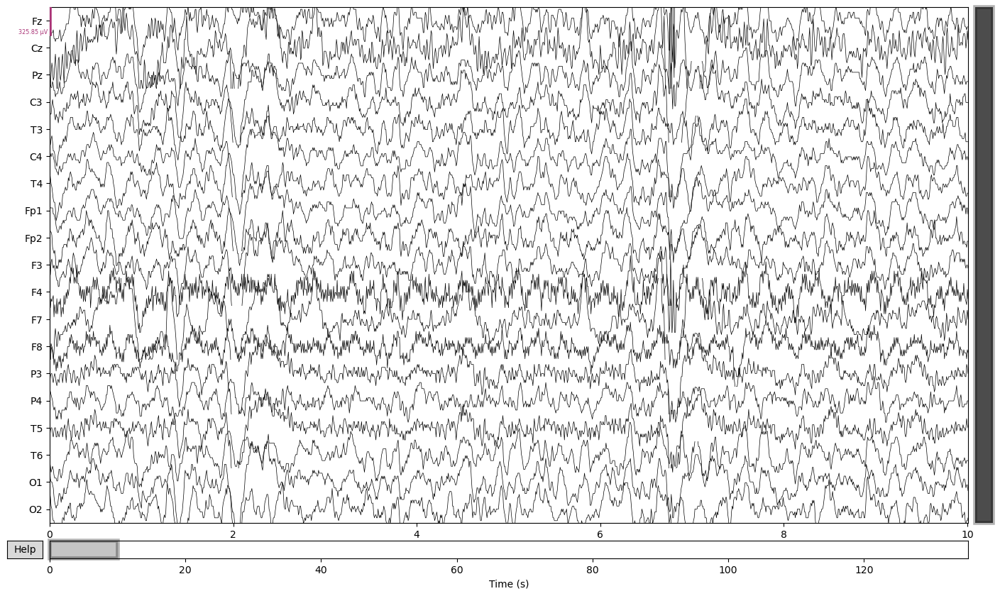

In [7]:
mne.viz.set_browser_backend("matplotlib")
raw.plot(scalings="auto", duration = 10.0)

Effective window size : 16.000 (s)


/var/folders/48/l60ld_dj1kggcvhp0rsys4qm0000gn/T/ipykernel_39768/1891957564.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  spectrum.plot()
/Users/juanvera/anaconda3/envs/rep2/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


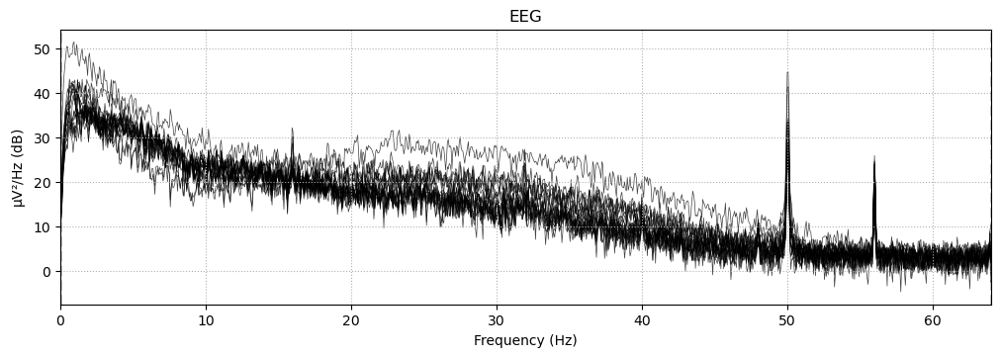

In [8]:
spectrum = raw.compute_psd()
spectrum.plot()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 213 samples (1.664 s)

Effective window size : 16.000 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/var/folders/48/l60ld_dj1kggcvhp0rsys4qm0000gn/T/ipykernel_39768/1049373829.py:5: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_filtered.compute_psd().plot()
/Users/juanvera/anaconda3/envs/rep2/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


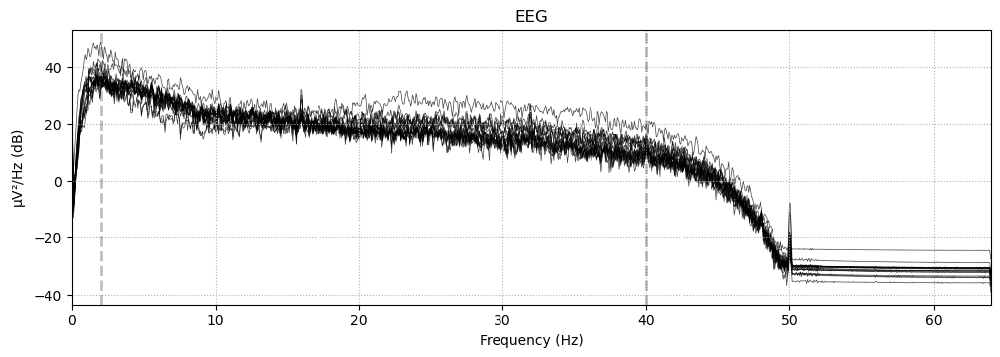

In [9]:
bp_low_cut_freq = 2
bp_high_cut_freq = 40

raw_filtered = raw.filter(bp_low_cut_freq, bp_high_cut_freq)
raw_filtered.compute_psd().plot()

In the aforewritten code, we filtered a signal using a bandpass filter. This bandpass filter had a low cut frequency (low_cut_freq) set as None, meaning we didn't set one. 
In regards to our dataset, we don't want to cut out the lower EEG frequency signals as ADHD can be characterized by those lowered frequency bands.

We set a high cut frequency (high_cut_freq) at 49 Hz to decrease artifacts as a result of powerline interference.

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 845 samples (6.602 s)

Effective window size : 16.000 (s)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/var/folders/48/l60ld_dj1kggcvhp0rsys4qm0000gn/T/ipykernel_39768/756744634.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_filtered.compute_psd().plot()
/Users/juanvera/anaconda3/envs/rep2/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


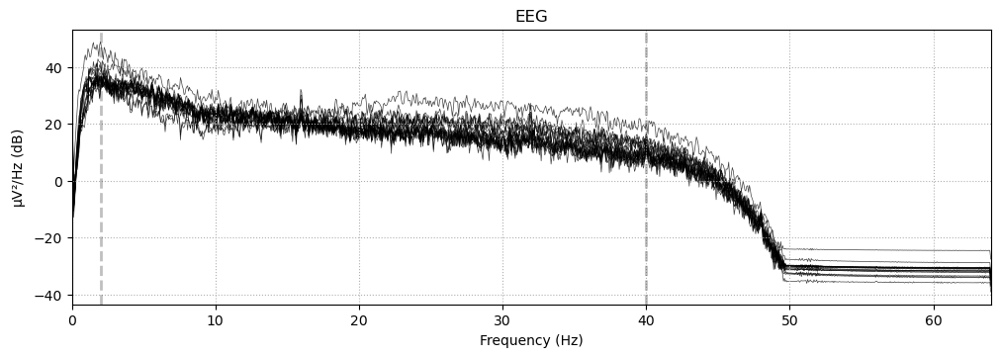

In [10]:
raw_filtered = raw_filtered.notch_filter(50)
raw_filtered.compute_psd().plot()

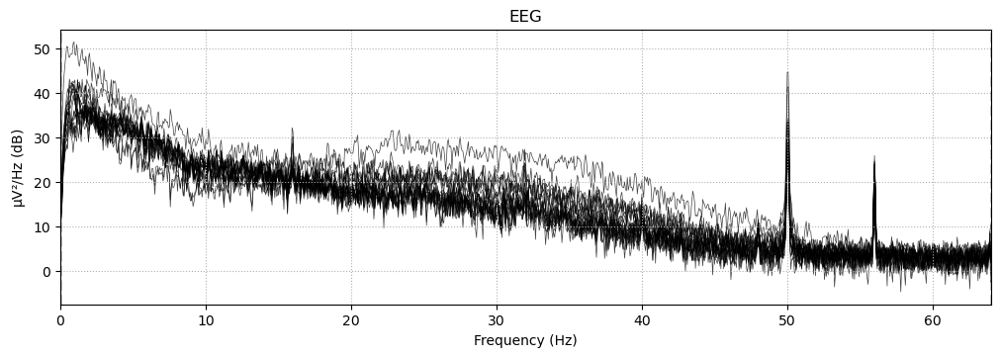

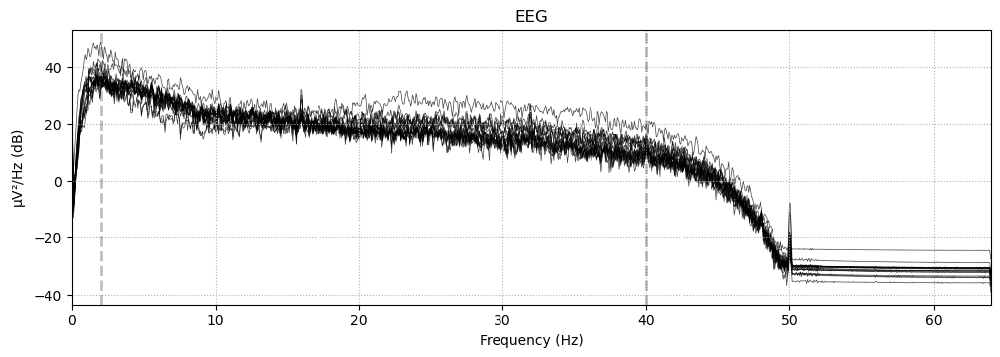

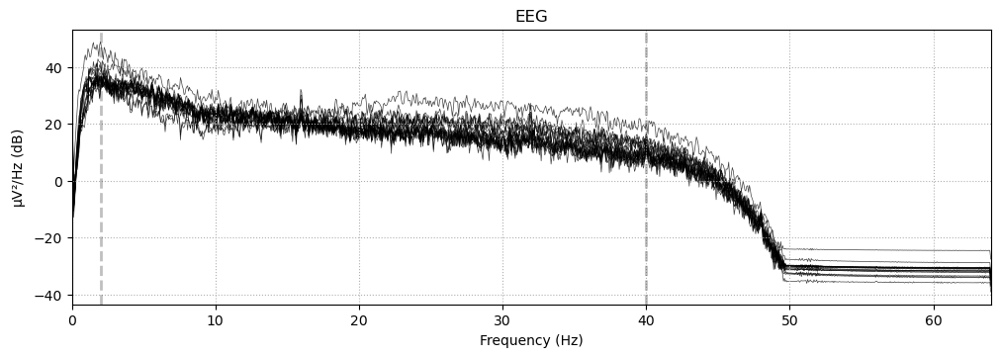

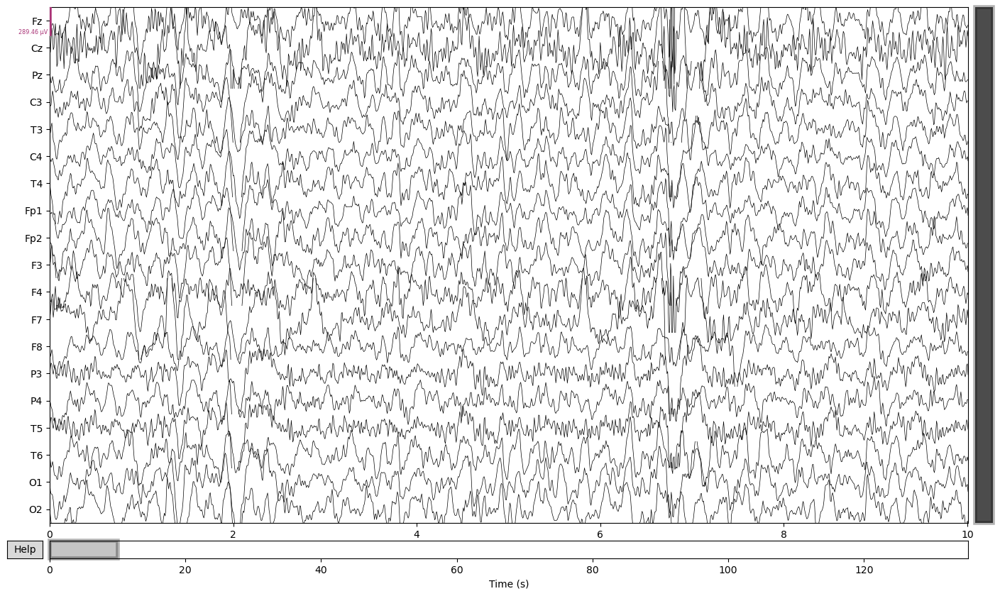

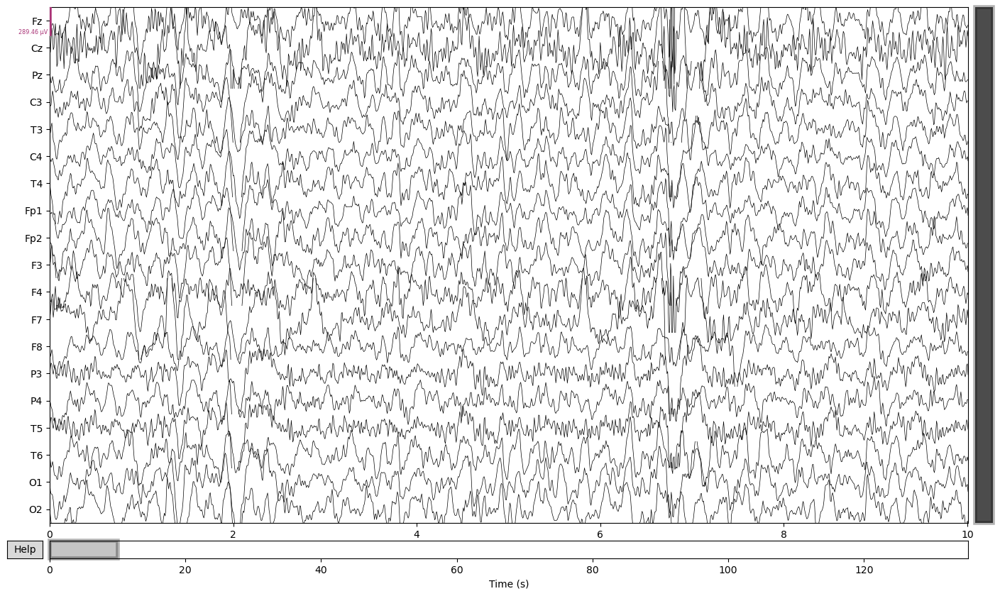

In [11]:
raw_filtered.plot(n_channels = 19, scalings = "auto", duration = 10.0)

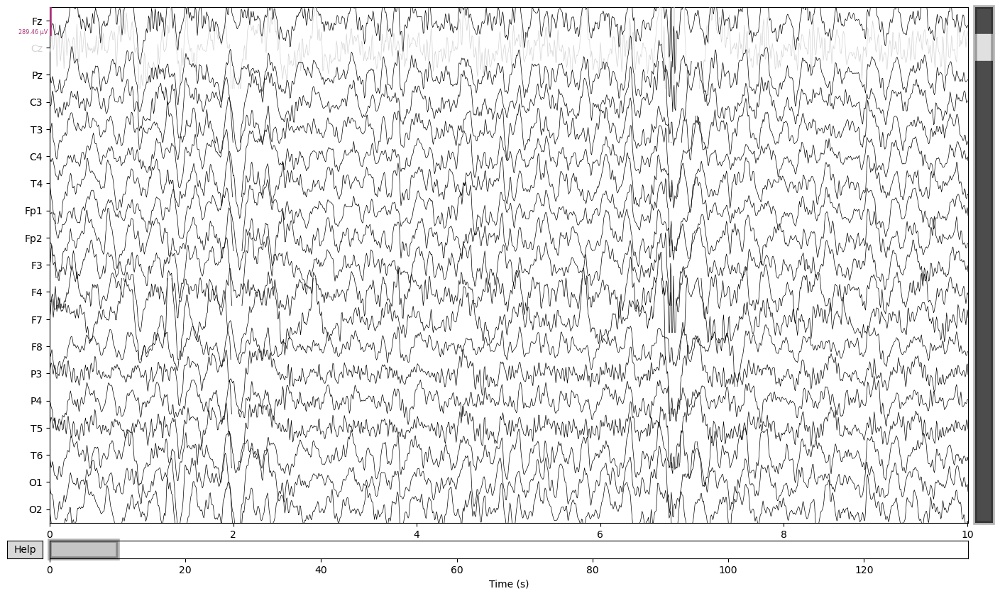

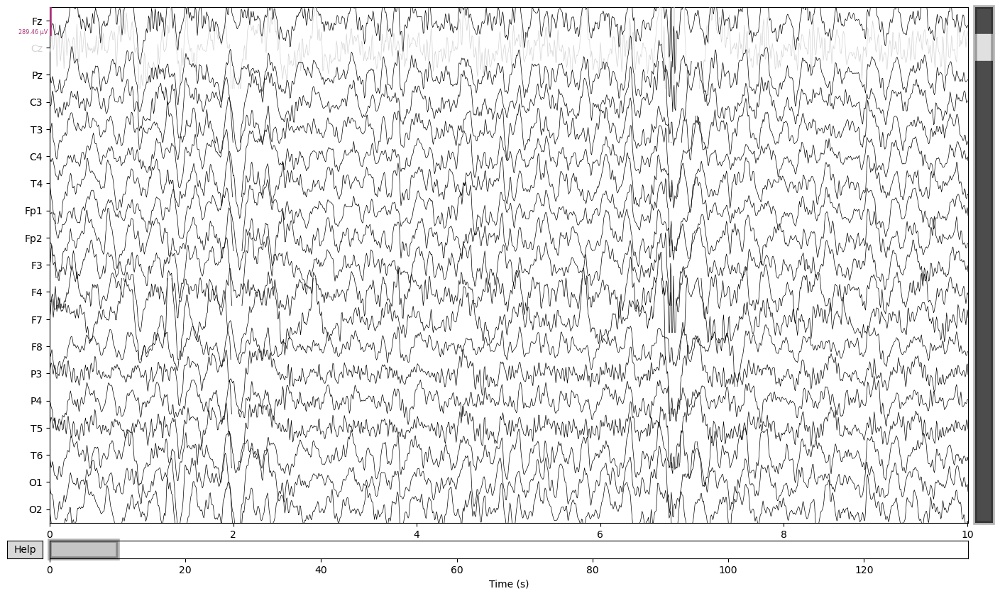

In [12]:
bad_channels = ['Cz']
raw_filtered.info['bads']=bad_channels
raw_filtered.plot(scalings = "auto", duration = 10.0)

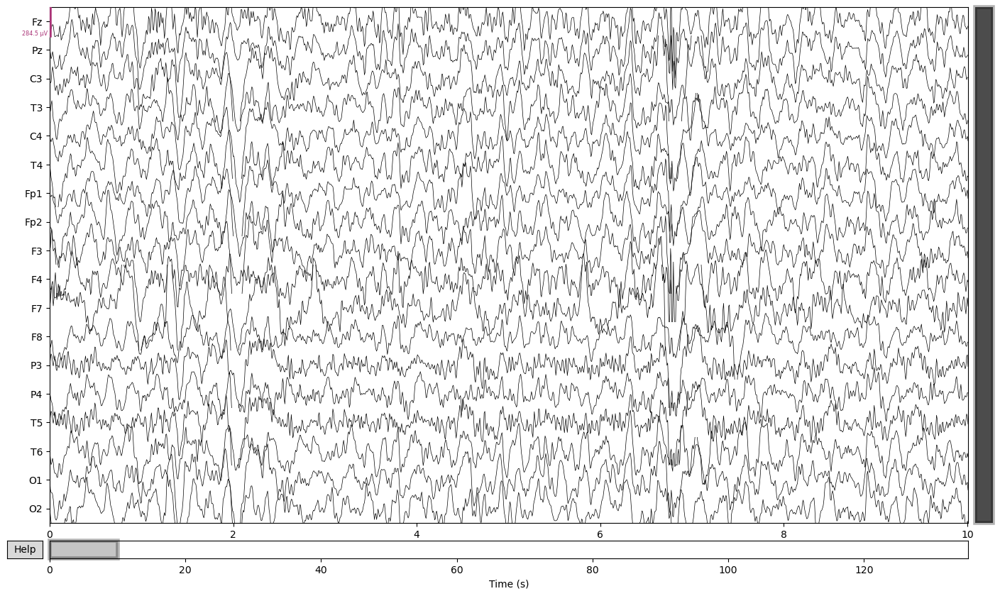

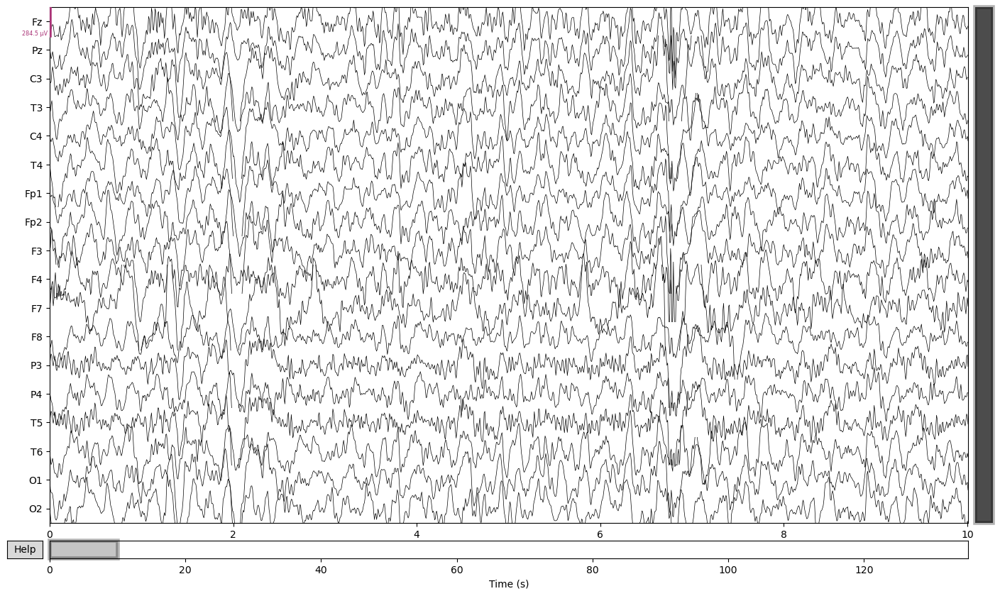

In [13]:
raw_filtered.drop_channels(ch_names = bad_channels)
raw_filtered.plot(scalings = "auto", duration = 10.0)

In [14]:
onset = [1.95, 6.65]
duration = [.2, .30]
description = ['bad'] * len(onset)

annotations = mne.Annotations(onset, duration, description)
raw_filtered.set_annotations(annotations)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,18 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,128.00 Hz
Highpass,2.00 Hz
Lowpass,40.00 Hz


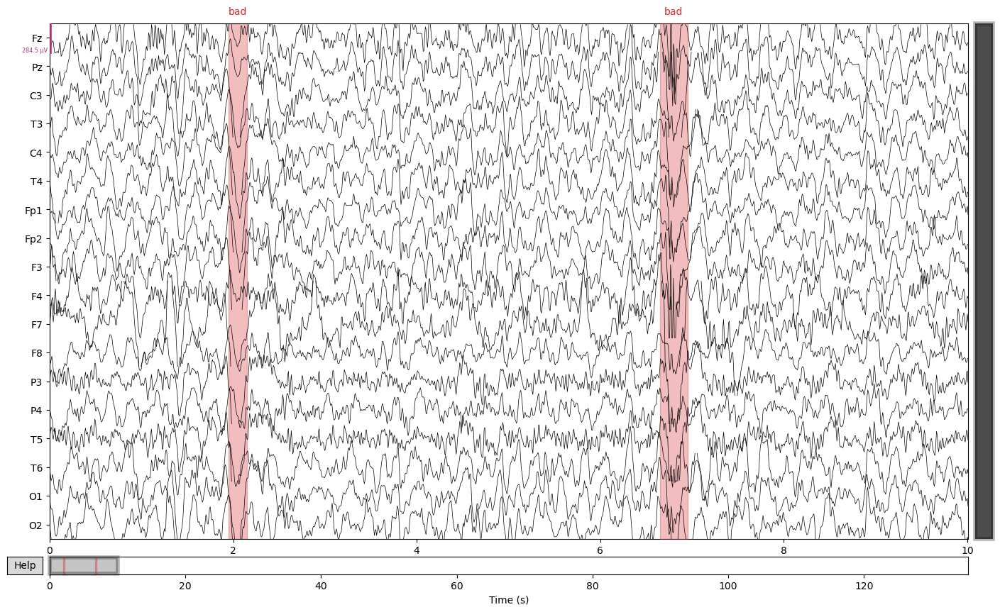

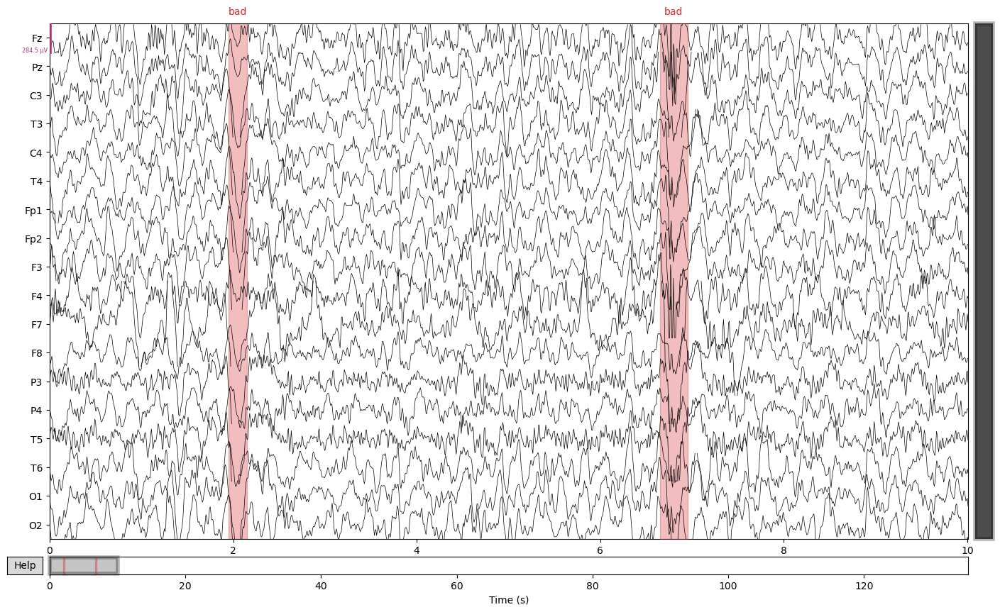

In [15]:
raw_filtered.plot(scalings = 'auto', duration = 10)

In [16]:
epochs = mne.make_fixed_length_epochs(raw_filtered, duration=.3, preload=False, reject_by_annotation=True)

Not setting metadata
451 matching events found
No baseline correction applied
0 projection items activated


Using data from preloaded Raw for 451 events and 38 original time points ...
4 bad epochs dropped
Using data from preloaded Raw for 447 events and 38 original time points ...
Using data from preloaded Raw for 32 events and 38 original time points ...


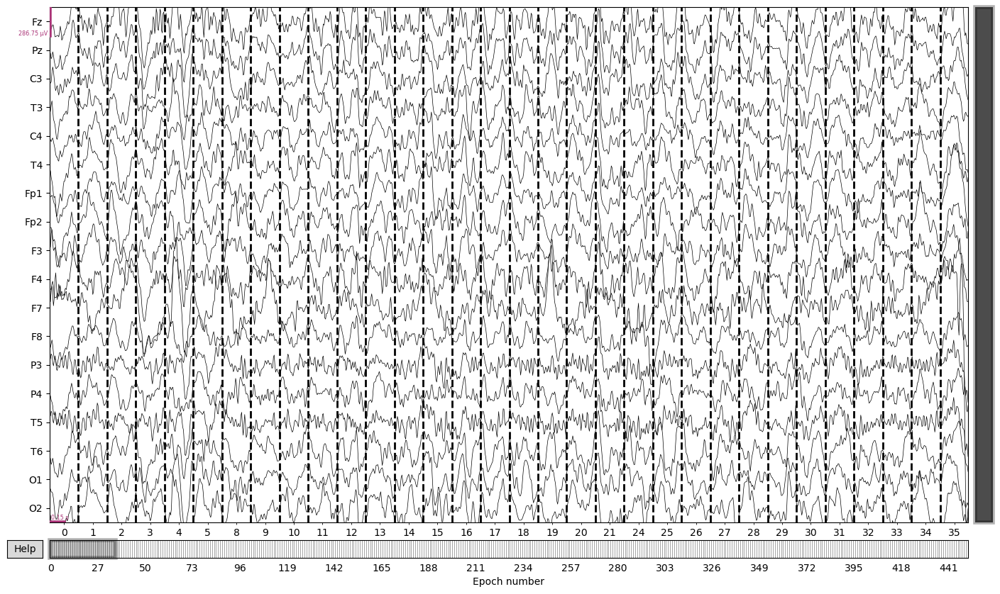

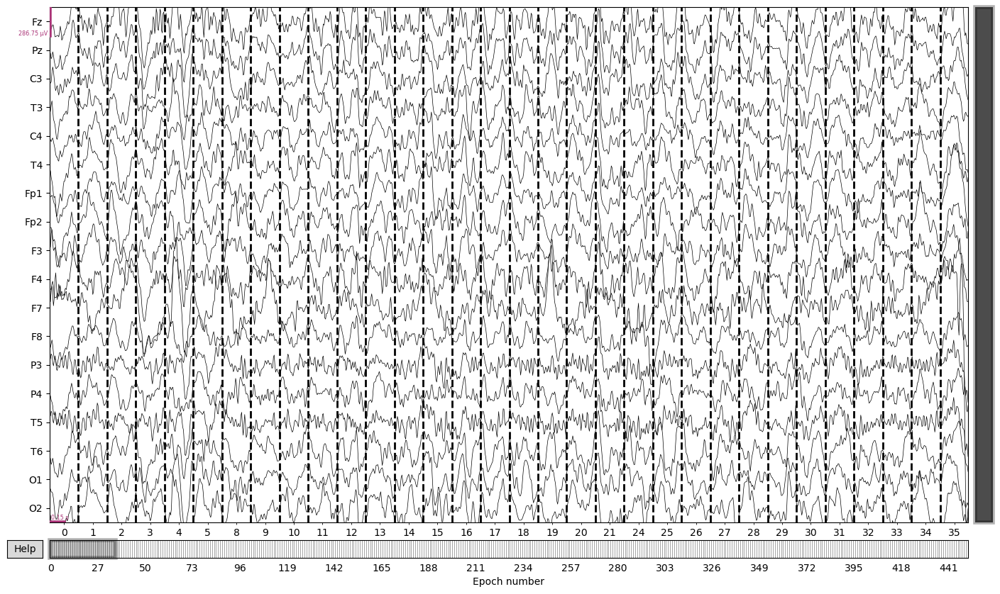

In [17]:
epochs.plot(scalings = 'auto', n_epochs=32)

In [18]:
raw_epoched = mne.concatenate_epochs([epochs])
raw_epoched = raw_epoched.get_data()
raw_epoched = np.concatenate(raw_epoched, axis=1)

Using data from preloaded Raw for 447 events and 38 original time points ...
Not setting metadata
447 matching events found
No baseline correction applied


/var/folders/48/l60ld_dj1kggcvhp0rsys4qm0000gn/T/ipykernel_39768/2973358031.py:1: RuntimeWarning: Concatenation of Annotations within Epochs is not supported yet. All annotations will be dropped.
  raw_epoched = mne.concatenate_epochs([epochs])
/var/folders/48/l60ld_dj1kggcvhp0rsys4qm0000gn/T/ipykernel_39768/2973358031.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  raw_epoched = raw_epoched.get_data()


In [19]:
ch_names = ['Fz', 'Pz', 'C3', 'T3', 'C4', 'T4', 'Fp1', 'Fp2', 'F3', 'F4', 'F7', 'F8', 'P3', 'P4', 'T5', 'T6', 'O1', 'O2']
info = mne.create_info(ch_names = ch_names, sfreq=sfreq, ch_types = 'eeg')
raw = mne.io.RawArray(raw_epoched, info)

Creating RawArray with float64 data, n_channels=18, n_times=16986
    Range : 0 ... 16985 =      0.000 ...   132.695 secs
Ready.


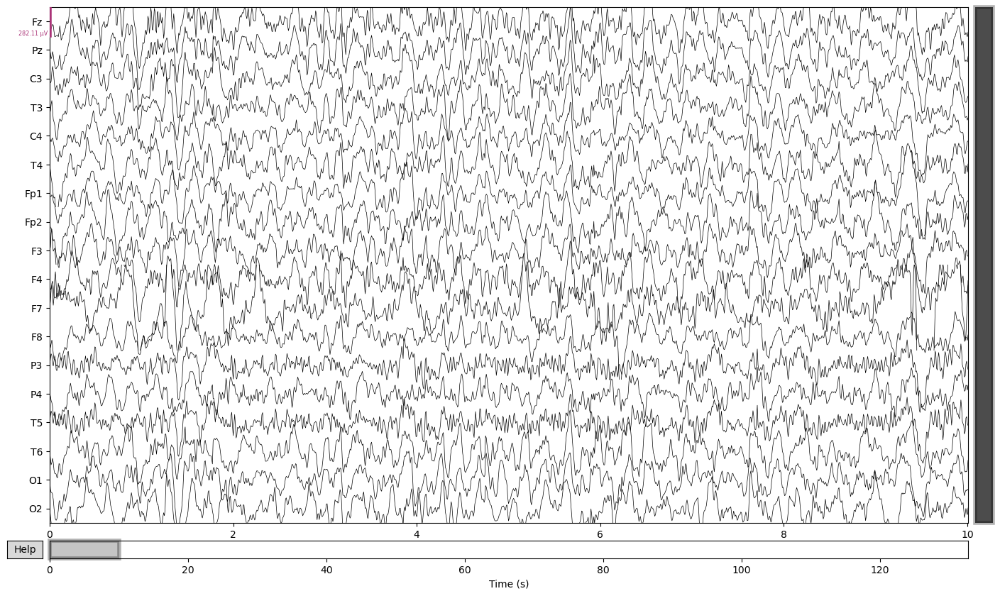

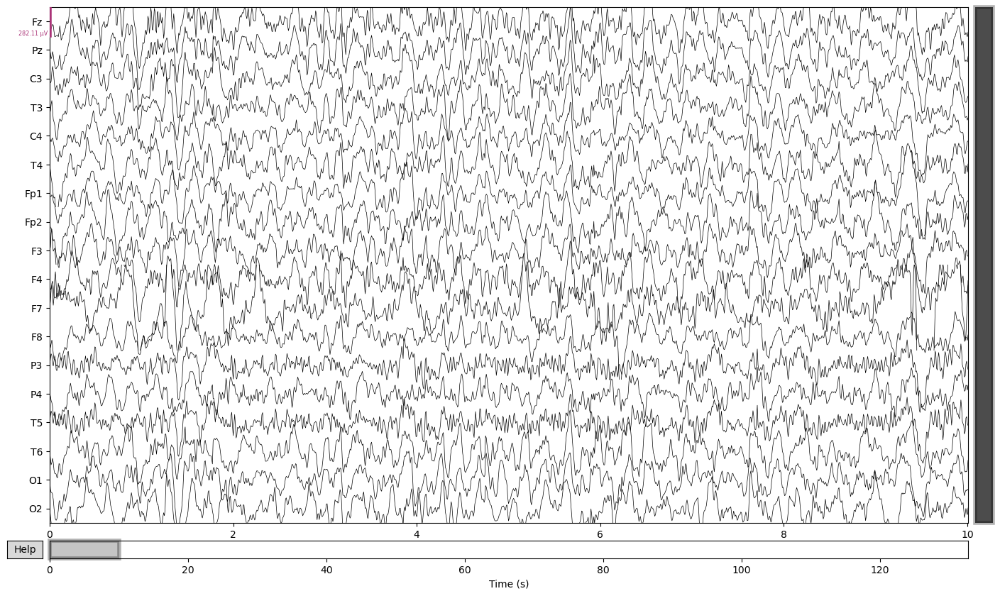

In [20]:
raw.plot(n_channels=19, scalings="auto", duration = 10.0)

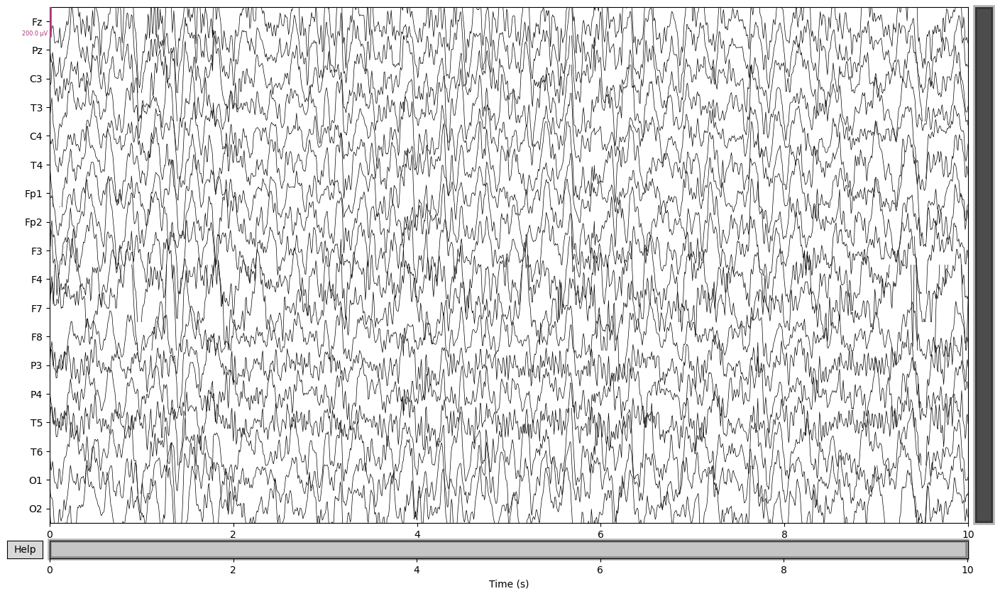

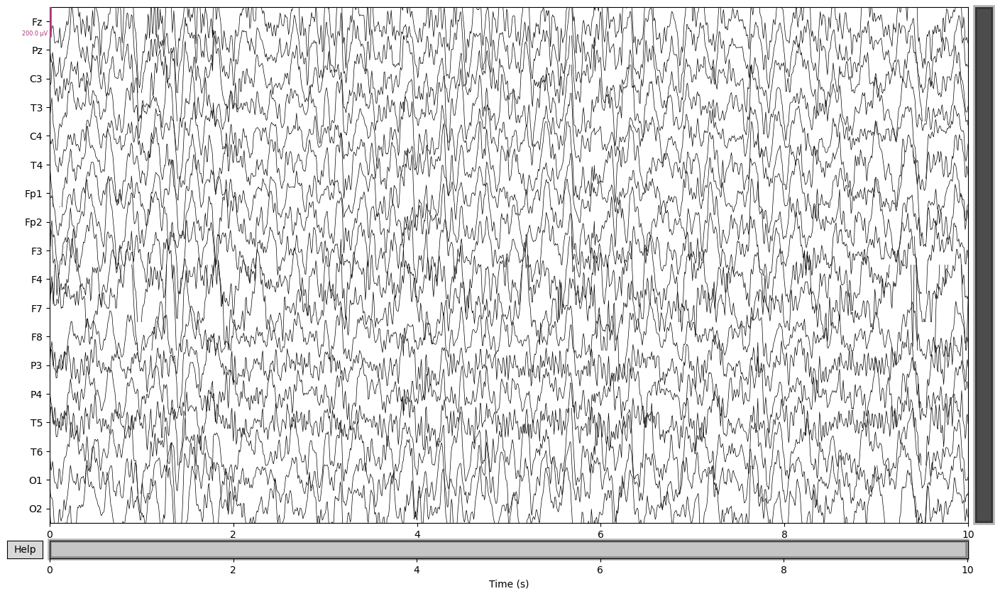

In [21]:
raw.set_montage('standard_1020')

raw_ica = raw.crop(tmin= 0, tmax=10)
raw_ica.plot(scalings = dict(eeg=1e-4))

In [22]:
n_components = 18
ica = ICA(n_components=n_components, random_state=10, max_iter = 1000)
ica.fit(raw_ica, verbose = 'ERROR')

/Users/juanvera/anaconda3/envs/rep2/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,1000 iterations on raw data (1281 samples)
ICA components,18
Available PCA components,18
Channel types,eeg
ICA components marked for exclusion,—


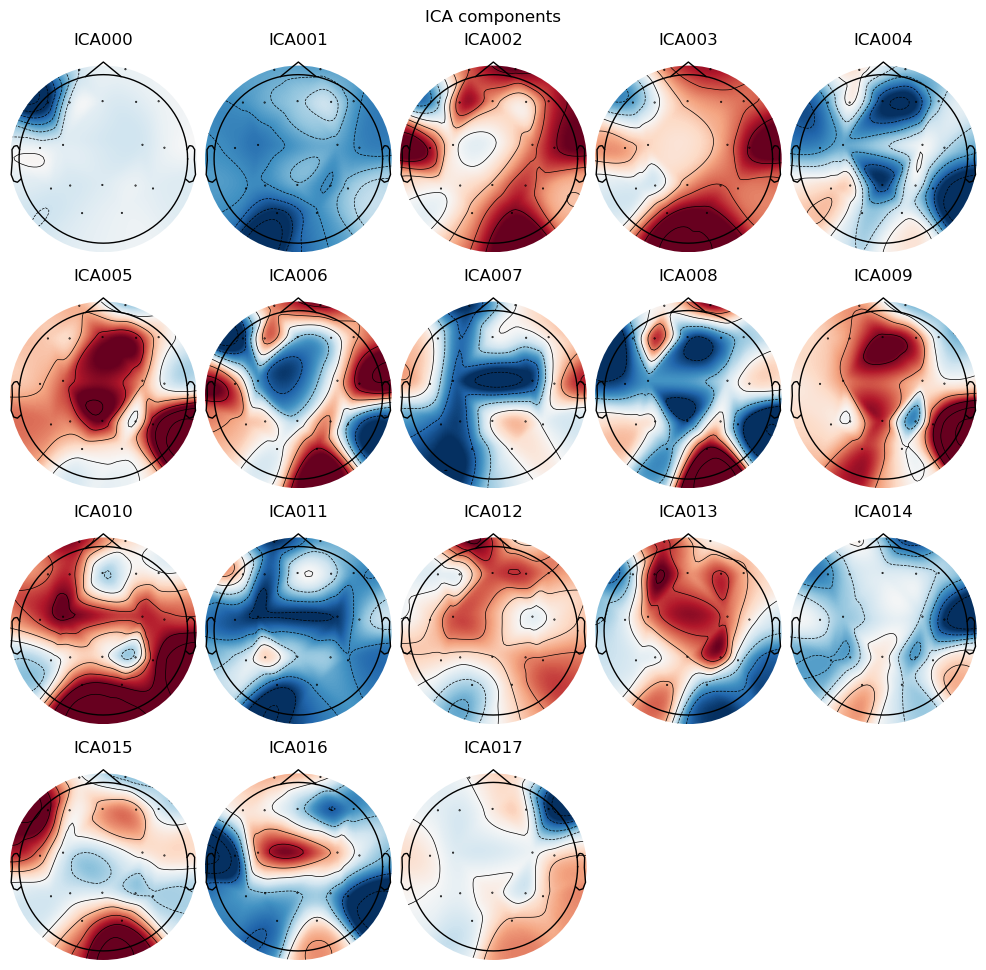

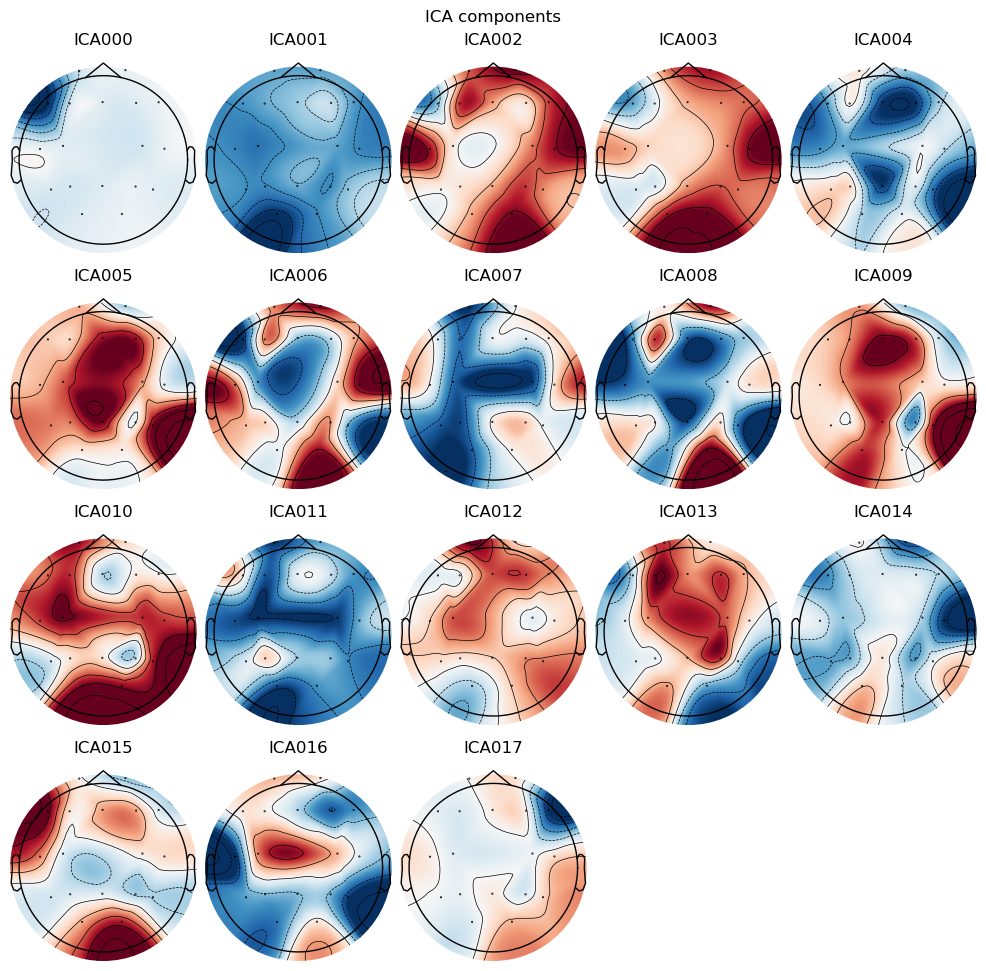

In [23]:
ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated


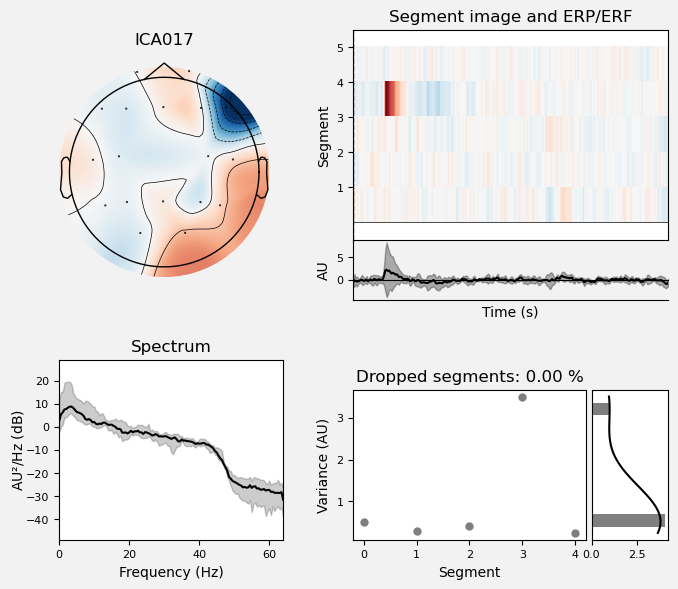

[<Figure size 700x600 with 6 Axes>]

In [24]:
ica.plot_properties(raw_ica, picks = 17)

In [25]:
ica.exclude = [0, 10, 12, 17]
raw_cleaned = ica.apply(raw_ica)

Applying ICA to Raw instance
    Transforming to ICA space (18 components)
    Zeroing out 4 ICA components
    Projecting back using 18 PCA components


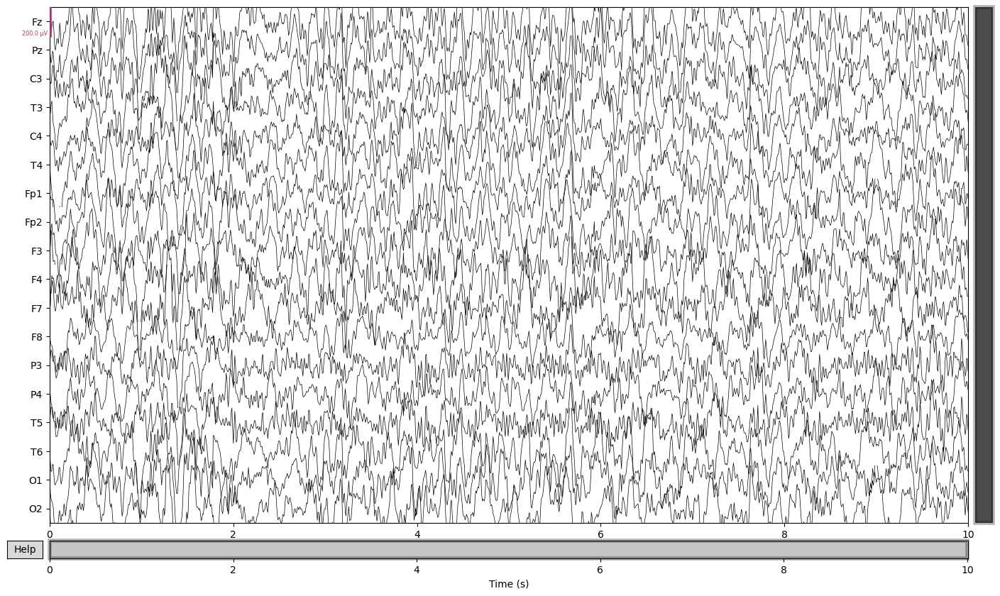

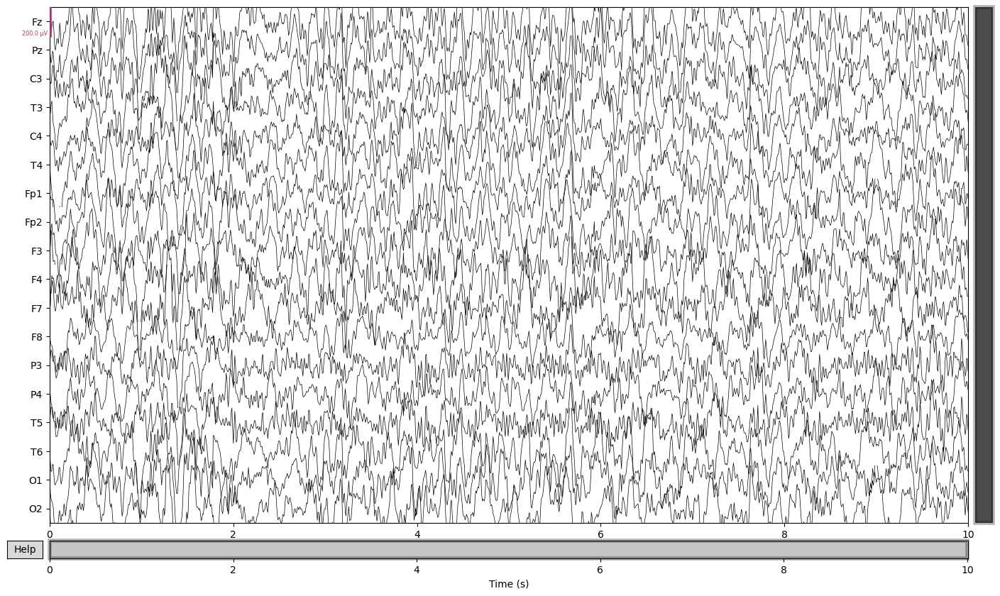

In [26]:
raw_cleaned.plot(scalings=dict(eeg=1e-4))

Not setting metadata
5 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 5 events and 256 original time points ...
0 bad epochs dropped
Using data from preloaded Raw for 5 events and 256 original time points ...
Using data from preloaded Raw for 5 events and 256 original time points ...


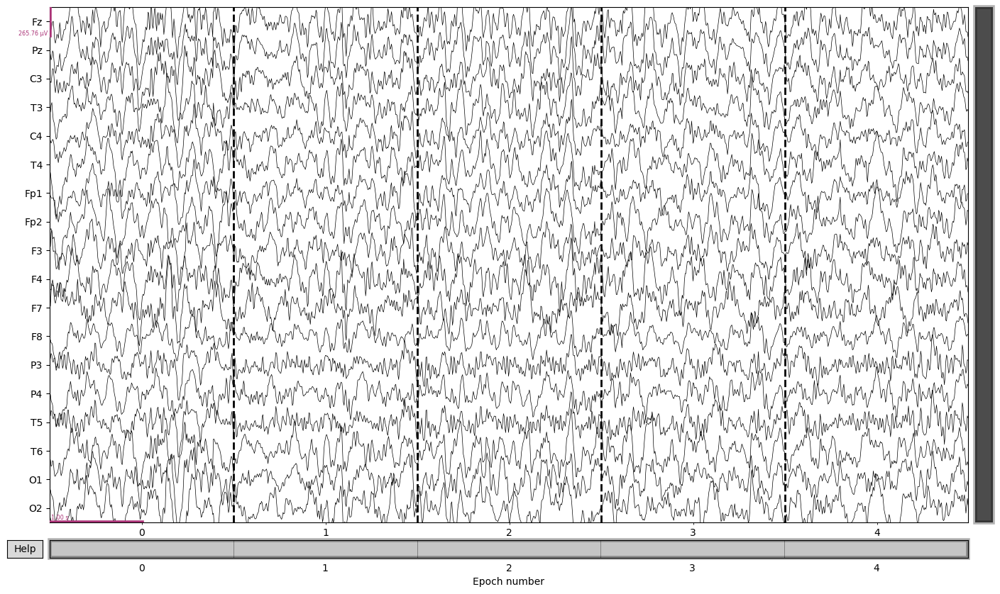

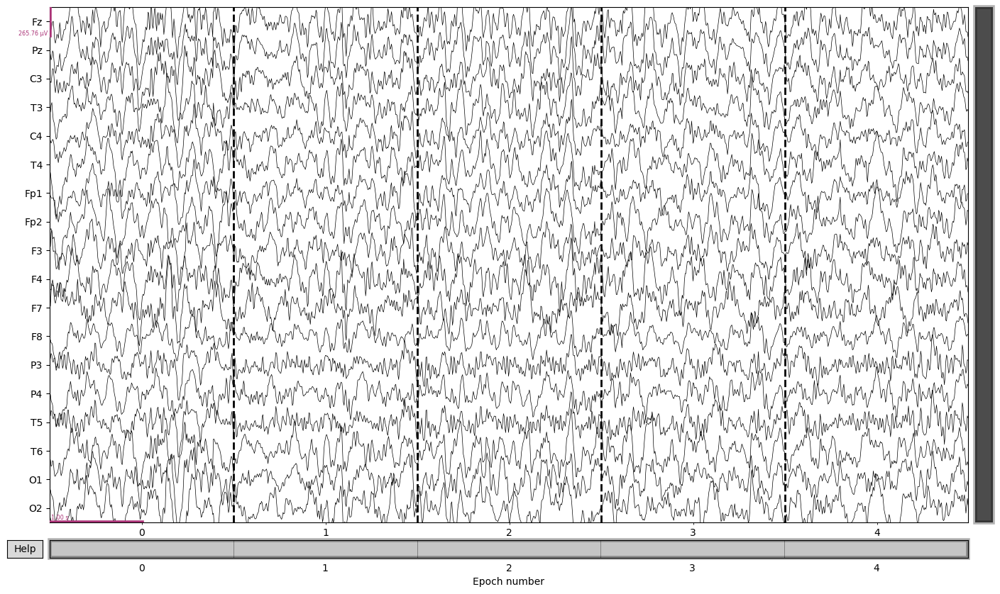

In [27]:
epochs = mne.make_fixed_length_epochs(raw_cleaned, duration=2, preload=False, reject_by_annotation=True)
epochs.plot(scalings = "auto")

Using data from preloaded Raw for 5 events and 256 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


/Users/juanvera/anaconda3/envs/rep2/lib/python3.11/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


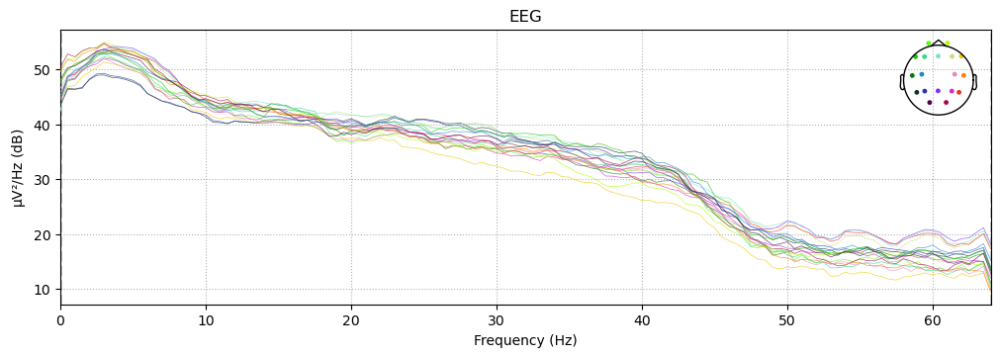

In [28]:
epochs_spectrum = epochs.compute_psd()
epochs_spectrum.plot()

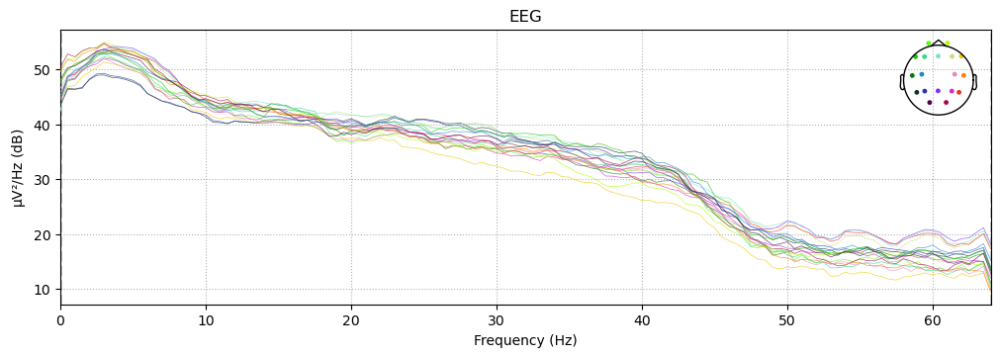

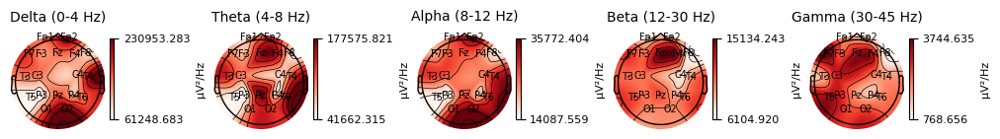

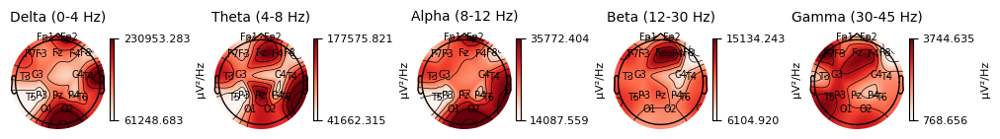

In [29]:
epochs_spectrum.plot_topomap(ch_type = 'eeg', show_names = True)

In [30]:
raw_epoched_2 = epochs.get_data()

Using data from preloaded Raw for 5 events and 256 original time points ...


In [31]:
psds, freqs = mne.time_frequency.psd_array_welch(raw_epoched_2, sfreq = 128, fmin = 4, fmax = 30, n_fft = 256)

Effective window size : 2.000 (s)


In [33]:
fmin_theta, fmax_theta = 4, 8
fmin_beta, fmax_beta = 13, 30 

theta_indices = (freqs >= fmin_theta) & (freqs <= fmax_theta)
beta_indices = (freqs >= fmin_beta) & (freqs <= fmax_beta)

In [35]:
psd_theta = psds[:, :, theta_indices].mean(axis=-1)
psd_beta = psds[:, :, beta_indices].mean(axis=-1)

In [36]:
theta_beta_ratio = psd_theta / psd_beta

In [38]:
print(theta_beta_ratio)

[[14.24585974 17.00854954  8.73644889 18.66439298 10.35378318 24.80291788
  15.53794867 23.18015227 10.19410801 22.81926067 18.47482058 15.85629424
   8.02090181 14.65767321  6.88291899 10.25030782 14.01618669 34.09462749]
 [14.14268983 23.74512228 13.7848695  18.73838238 11.57862147 16.02754893
  10.77896311 15.59140046  6.46788619 12.07241129  3.1350443  16.57906325
   1.21217917 10.00192009  1.13746622 18.61028476 17.29716471 13.4303745 ]
 [ 9.72703461 11.6778984  11.86698283  9.20870894  9.83779854 11.52738504
   9.04488704 17.76950501  5.22511413  8.59557069  8.53960467 11.44716499
   1.57528786  9.28832179  1.45063329 16.27778208 16.73691082 15.04533255]
 [22.83171869 27.73154983 10.6697696  24.90448829 11.33849498 12.91807595
   8.56041358 10.12631801  5.96810591 18.87360354  6.27188118 14.98131042
   8.51126961  7.17636289  5.83429323 21.62826478  8.65682859 10.66859703]
 [ 5.88553342 10.21934253  8.70449541  9.97584756  5.40288631 16.34475158
   8.43228802 18.31463182  5.86610

In [47]:
midfrontal_ch_indices = [0, 6, 7, 8, 10, 11, 12] 
midfrontal_ch_names = ['Fz', 'Fp1', 'Fp2', 'F3,' 'F4', 'F7', 'F8']

midfrontal_ch_data = theta_beta_ratio[:, selected_channels_indices]

for i, channel_data in enumerate(midfrontal_ch_data):
    print(f"EPOCH {i + 1} | {', '.join(f'{name}: {value:.5f}' for name, value in zip(midfrontal_ch_names, channel_data))}")

EPOCH 1 | Fz: 14.24586, Fp1: 15.53795, Fp2: 23.18015, F3,F4: 18.47482, F7: 15.85629, F8: 8.02090
EPOCH 2 | Fz: 14.14269, Fp1: 10.77896, Fp2: 15.59140, F3,F4: 3.13504, F7: 16.57906, F8: 1.21218
EPOCH 3 | Fz: 9.72703, Fp1: 9.04489, Fp2: 17.76951, F3,F4: 8.53960, F7: 11.44716, F8: 1.57529
EPOCH 4 | Fz: 22.83172, Fp1: 8.56041, Fp2: 10.12632, F3,F4: 6.27188, F7: 14.98131, F8: 8.51127
EPOCH 5 | Fz: 5.88553, Fp1: 8.43229, Fp2: 18.31463, F3,F4: 7.12866, F7: 9.07346, F8: 1.24250


In [49]:
avg_midfrontal = midfrontal_ch_data.mean(axis=1)

for i, average_value in enumerate(avg_midfrontal):
    print(f"EPOCH {i + 1} | Average Midfrontal: {average_value:.5f}")

EPOCH 1 | Average Midfrontal: 15.88600
EPOCH 2 | Average Midfrontal: 10.23989
EPOCH 3 | Average Midfrontal: 9.68391
EPOCH 4 | Average Midfrontal: 11.88049
EPOCH 5 | Average Midfrontal: 8.34618
